# Image Reconstruction with Diffusion Models
This notebook demonstrates how to reconstruct or restore images using Stable Diffusion.


In [1]:
!pip install diffusers transformers accelerate safetensors torch --quiet

In [2]:
!pip install opencv-python-headless scikit-image pillow matplotlib numpy --quiet

# Abra as imagens

In [3]:
from PIL import Image
import matplotlib.pyplot as plt
from google.colab import files
import io

def upload_image():
    uploaded = files.upload()
    filename = next(iter(uploaded))
    return Image.open(io.BytesIO(uploaded[filename]))

def save_image(img, path):
    img.save(path)

def show_image(img, title="Image", figsize=(6,6), cmap=None):
    plt.figure(figsize=figsize)
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis("off")
    plt.show()

def overlay_mask(image, mask, color=(255,0,0), alpha=0.5):
  image = image.convert("RGBA")
  mask = mask.convert("L")
  overlay = Image.new("RGBA", image.size, color + (0,))
  overlay.putalpha(mask.point(lambda p: int(p*alpha)))
  return Image.alpha_composite(image, overlay)

In [4]:
image = upload_image()

Saving to_restore3.jpg to to_restore3.jpg


# Gere as máscaras

In [5]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from skimage import filters, morphology, exposure
from skimage.filters import threshold_otsu, sobel
from skimage import exposure
from scipy.ndimage import gaussian_filter
import os

plt.rcParams['figure.figsize'] = (10,6)

In [6]:
def load_image(path='input.png'):
    if not os.path.exists(path):
        raise FileNotFoundError(f"Arquivo '{path}' não encontrado. Coloque sua imagem como 'input.png' no diretório do notebook.")
    img = cv2.imread(path, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def save_mask(mask, path='mask.png'):
    # mask: binary (0/1) or 0/255
    m = (mask > 0).astype(np.uint8) * 255
    Image.fromarray(m).save(path)

def overlay_mask_on_image(img, mask, alpha=0.6):
    overlay = img.copy().astype(np.float32)
    red = np.zeros_like(img)
    red[...,0] = 255
    mask3 = np.stack([mask,mask,mask],axis=-1)
    overlay = (1-alpha)*overlay + alpha*(mask3*red + (1-mask3)*overlay)
    return overlay.astype(np.uint8)

In [14]:
def detect_edges_mask(gray, low=50, high=150, dilate=3):
    edges = cv2.Canny(gray, low, high)
    # dilate to make edges thicker
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (dilate,dilate))
    edges = cv2.dilate(edges, kernel, iterations=1)
    return (edges>0).astype(np.uint8)

def detect_laplacian_mask(gray, ksize=3, thresh=None, dilate=5):
    lap = cv2.Laplacian(gray, cv2.CV_32F, ksize=ksize)
    lap = np.abs(lap)
    lap = (lap - lap.min()) / (lap.max() - lap.min() + 1e-9)
    if thresh is None:
        # Otsu-like: use skimage threshold
        thresh_val = filters.threshold_otsu((lap*255).astype(np.uint8))/255.0
    else:
        thresh_val = thresh
    mask = (lap > thresh_val).astype(np.uint8)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (dilate,dilate))
    mask = cv2.morphologyEx(mask.astype(np.uint8), cv2.MORPH_CLOSE, kernel)
    return mask

def detect_spots_mask(gray, block_size=35, offset=10, min_size=20):
    # Adaptive threshold to find dark or bright spots
    th = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                               cv2.THRESH_BINARY_INV, block_size, offset)
    th = (th>0).astype(np.uint8)
    # remove small artifacts
    th = morphology.remove_small_objects(th.astype(bool), min_size=min_size)
    return th.astype(np.uint8)

def combine_masks(masks, min_size=10):
    combined = np.zeros_like(masks[0], dtype=np.uint8)
    for m in masks:
        combined = np.logical_or(combined, m>0)
    combined = combined.astype(np.uint8)
    # remove tiny regions
    combined = morphology.remove_small_objects(combined.astype(bool), min_size=min_size)
    return combined.astype(np.uint8)


In [15]:
# Pipeline principal
def generate_defect_masks(img_rgb):
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    # equalize contrast to enhance defects
    gray_eq = exposure.equalize_adapthist(gray/255.0)
    gray_eq = (gray_eq*255).astype(np.uint8)

    # 1) edges (good for scratches)
    edges_mask = detect_edges_mask(gray_eq, low=30, high=120, dilate=3)

    # 2) laplacian (high-frequency defects)
    lap_mask = detect_laplacian_mask(gray_eq, ksize=3, thresh=None, dilate=5)

    # 3) adaptive threshold for spots/tears
    spots_mask = detect_spots_mask(gray_eq, block_size=49, offset=12, min_size=50)

    # 4) combine
    combined = combine_masks([edges_mask, lap_mask, spots_mask], min_size=30)

    # optional: fill holes and smooth borders
    combined = morphology.binary_closing(combined, morphology.disk(3))
    combined = morphology.binary_opening(combined, morphology.disk(2))

    return {
        'gray': gray_eq,
        'edges': edges_mask.astype(np.uint8),
        'laplacian': lap_mask.astype(np.uint8),
        'spots': spots_mask.astype(np.uint8),
        'combined': combined.astype(np.uint8)
    }


In [9]:
def generate_strong_masks(img_rgb):

    # converter para grayscale
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

    # equalizar contraste
    gray_eq = exposure.equalize_adapthist(gray / 255.0)
    gray_eq = (gray_eq * 255).astype(np.uint8)

    # ===========================
    # 1) CANNY (forte)
    # ===========================
    edges = cv2.Canny(gray_eq, 40, 120)

    # ===========================
    # 2) LAPLACIAN + threshold
    # ===========================
    lap = cv2.Laplacian(gray_eq, cv2.CV_64F)
    lap = np.abs(lap)
    lap_norm = (lap / lap.max() * 255).astype(np.uint8)
    th = threshold_otsu(lap_norm)
    lap_mask = (lap_norm > th).astype(np.uint8) * 255

    # ===========================
    # 3) SPOTS -> diferença da mediana
    # ===========================
    median = cv2.medianBlur(gray_eq, 11)
    diff = cv2.absdiff(gray_eq, median)
    diff_norm = (diff / diff.max() * 255).astype(np.uint8)
    th2 = threshold_otsu(diff_norm)
    spots = (diff_norm > th2).astype(np.uint8) * 255

    # ===========================
    # 4) SOBEL magnitude
    # ===========================
    sobel_mag = sobel(gray_eq.astype(float))
    sobel_norm = (sobel_mag / sobel_mag.max() * 255).astype(np.uint8)
    th3 = threshold_otsu(sobel_norm)
    sobel_mask = (sobel_norm > th3).astype(np.uint8) * 255

    # ===========================
    # 5) VARIÂNCIA LOCAL (identifica áreas anômalas)
    # ===========================
    blur = gaussian_filter(gray_eq.astype(float), sigma=3)
    local_std = np.abs(gray_eq - blur)
    local_std = (local_std / local_std.max() * 255).astype(np.uint8)
    th4 = threshold_otsu(local_std)
    anomaly_mask = (local_std > th4).astype(np.uint8) * 255

    return {
        "edges": edges.astype(np.uint8),
        "laplacian": lap_mask.astype(np.uint8),
        "spots": spots.astype(np.uint8),
        "sobel": sobel_mask.astype(np.uint8),
        "anomaly": anomaly_mask.astype(np.uint8),
    }


In [16]:
def combine_masks_dict(masks_dict):
    # converte todas para binário 0/1
    bin_masks = [(m > 0).astype(np.uint8) for m in masks_dict.values()]

    # OR lógico sucessivo
    combined = np.zeros_like(bin_masks[0])
    for m in bin_masks:
        combined = np.logical_or(combined, m)

    return (combined.astype(np.uint8) * 255)

In [11]:
def clean_mask(mask):

    # kernel ajustável
    kernel = np.ones((3,3), np.uint8)

    # 1) fechamento → preenche buracos
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    # 2) dilatação → aumenta ligeiramente a área
    mask = cv2.dilate(mask, kernel, iterations=1)

    # 3) remover regiões pequenas
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(mask)
    cleaned = np.zeros_like(mask)

    min_area = 20  # ajuste conforme necessário
    for i in range(1, num_labels):
        if stats[i, cv2.CC_STAT_AREA] >= min_area:
            cleaned[labels == i] = 255

    return cleaned

In [17]:
# Executar pipeline com a imagem 'input.png' e salvar máscaras
image_np = np.array(image)
masks = generate_defect_masks(image_np)

# salvar máscaras individuais e combinada
save_mask(masks['edges']*255, path='mask_edges.png')
save_mask(masks['laplacian']*255, path='mask_laplacian.png')
save_mask(masks['spots']*255, path='mask_spots.png')
save_mask(masks['combined']*255, path='mask.png')

# salvar overlay para visualização
overlay = overlay_mask_on_image(image_np, masks['combined'])
Image.fromarray(overlay).save('mask_overlay.png')

print('Máscaras salvas: mask_edges.png, mask_laplacian.png, mask_spots.png, mask.png, mask_overlay.png')


Máscaras salvas: mask_edges.png, mask_laplacian.png, mask_spots.png, mask.png, mask_overlay.png


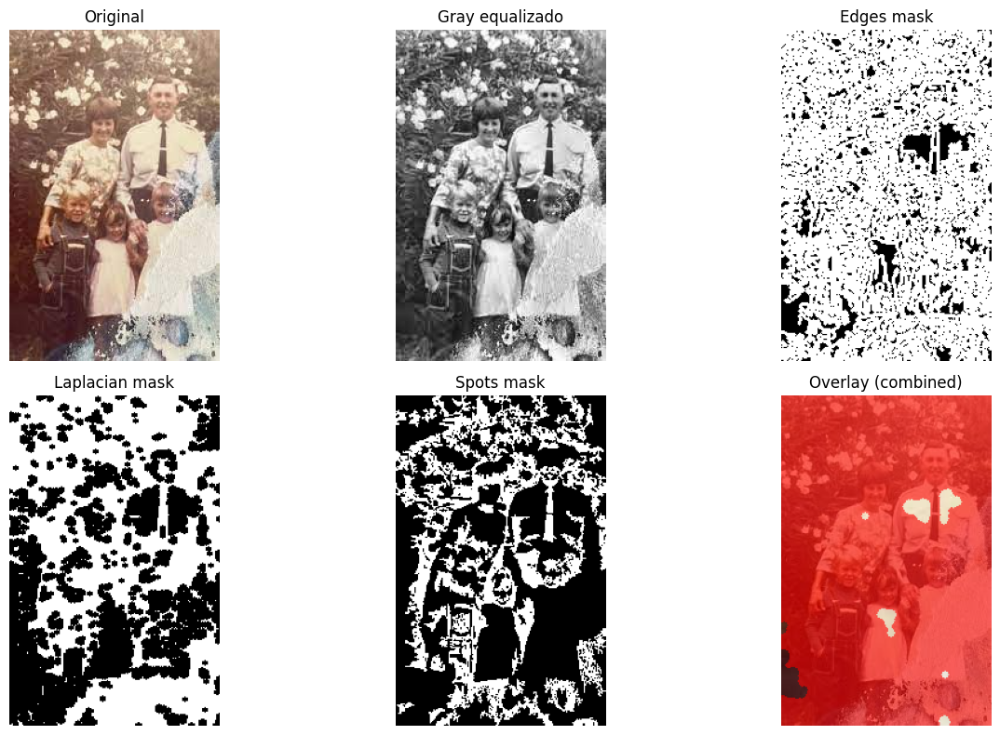

In [18]:
# Mostrar resultados no notebook
fig, axs = plt.subplots(2,3, figsize=(14,8))
axs[0,0].imshow(image_np); axs[0,0].set_title('Original'); axs[0,0].axis('off')
axs[0,1].imshow(masks['gray'], cmap='gray'); axs[0,1].set_title('Gray equalizado'); axs[0,1].axis('off')
axs[0,2].imshow(masks['edges'], cmap='gray'); axs[0,2].set_title('Edges mask'); axs[0,2].axis('off')
axs[1,0].imshow(masks['laplacian'], cmap='gray'); axs[1,0].set_title('Laplacian mask'); axs[1,0].axis('off')
axs[1,1].imshow(masks['spots'], cmap='gray'); axs[1,1].set_title('Spots mask'); axs[1,1].axis('off')
axs[1,2].imshow(overlay); axs[1,2].set_title('Overlay (combined)'); axs[1,2].axis('off')
plt.tight_layout()
plt.show()


In [19]:
# Executar pipeline com a imagem 'input.png' e salvar máscaras
image_np = np.array(image)
masks = generate_strong_masks(image_np)

# salvar máscaras individuais e combinada
save_mask(masks['edges']*255, path='mask_edges.png')
save_mask(masks['laplacian']*255, path='mask_laplacian.png')
save_mask(masks['spots']*255, path='mask_spots.png')
save_mask(masks['sobel']*255, path='mask_sobel.png')
save_mask(masks['anomaly']*255, path='mask_anomaly.png')

# # salvar overlay para visualização
# overlay = overlay_mask_on_image(image_np, masks['combined'])
# Image.fromarray(overlay).save('mask_overlay.png')

print('Máscaras salvas: mask_edges.png, mask_laplacian.png, mask_spots.png, mask_sobel.png, mask_anomaly.png')


Máscaras salvas: mask_edges.png, mask_laplacian.png, mask_spots.png, mask_sobel.png, mask_anomaly.png


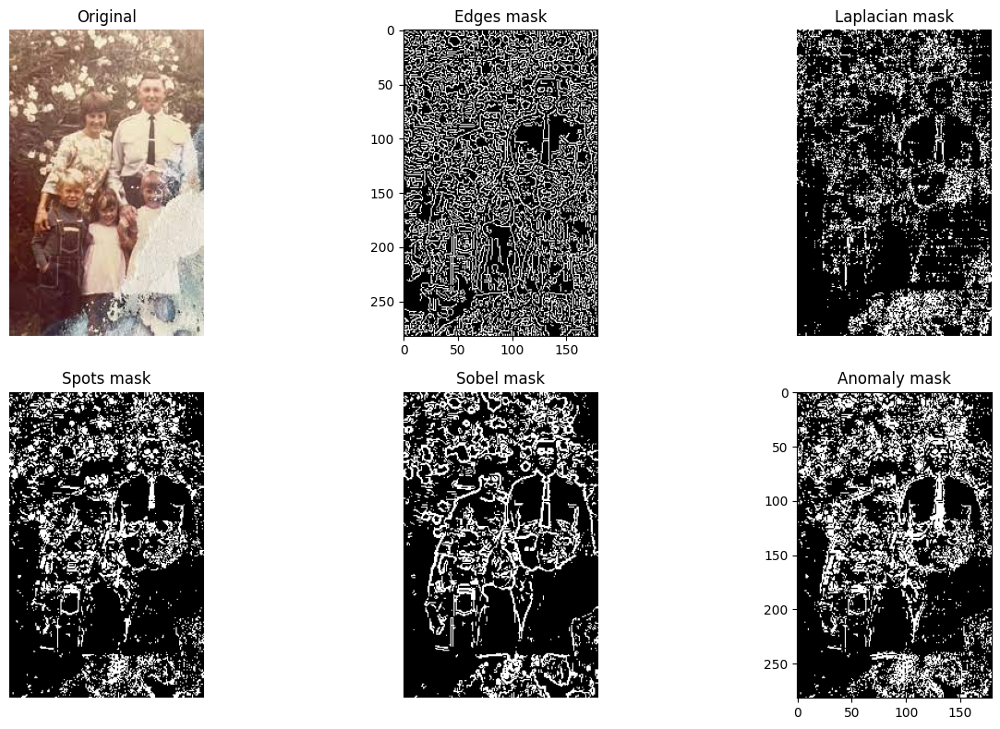

In [20]:
# Mostrar resultados no notebook
fig, axs = plt.subplots(2,3, figsize=(14,8))
axs[0,0].imshow(image_np); axs[0,0].set_title('Original'); axs[0,0].axis('off')
axs[0,1].imshow(masks['edges'], cmap='gray'); axs[0,1].set_title('Edges mask'); axs[0,2].axis('off')
axs[0,2].imshow(masks['laplacian'], cmap='gray'); axs[0,2].set_title('Laplacian mask'); axs[1,0].axis('off')
axs[1,0].imshow(masks['spots'], cmap='gray'); axs[1,0].set_title('Spots mask'); axs[1,1].axis('off')
axs[1,1].imshow(masks['sobel'], cmap='gray'); axs[1,1].set_title('Sobel mask'); axs[1,1].axis('off')
axs[1,2].imshow(masks['anomaly'], cmap='gray'); axs[1,2].set_title('Anomaly mask'); axs[1,1].axis('off')
plt.tight_layout()
plt.show()

In [21]:
combined_mask = combine_masks_dict(masks)
cleaned = clean_mask(combined_mask)

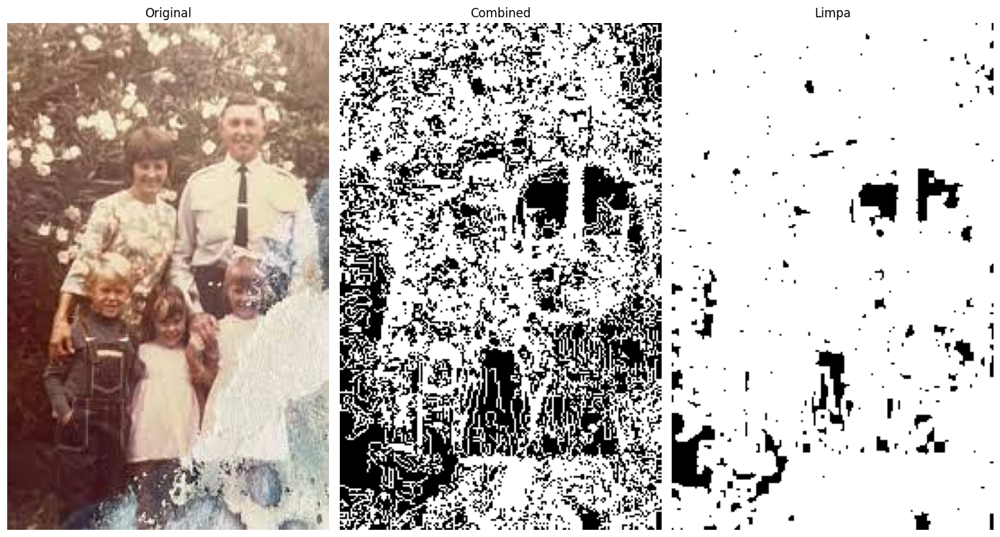

In [22]:
# Mostrar resultados no notebook
fig, axs = plt.subplots(1,3, figsize=(14,8))
axs[0].imshow(image_np); axs[0].set_title('Original'); axs[0].axis('off')
axs[1].imshow(combined_mask, cmap='gray'); axs[1].set_title('Combined'); axs[1].axis('off')
axs[2].imshow(cleaned, cmap='gray'); axs[2].set_title('Limpa'); axs[2].axis('off')
plt.tight_layout()
plt.show()

In [23]:
def detect_big_stain(img_rgb):
    img = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)

    h, s, v = cv2.split(img)

    # manchas muito claras → alto valor, pouca saturação
    stain = (v > 200) & (s < 30)

    mask = stain.astype(np.uint8) * 255

    # suavizar e fechar buracos
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((15,15), np.uint8))
    mask = cv2.GaussianBlur(mask, (51, 51), 0)

    return mask

In [24]:
image_np = np.array(image)
stain_mask = detect_big_stain(image_np)

array([[  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255],
       [  0,   0,   0, ..., 255, 255, 255]], dtype=uint8)
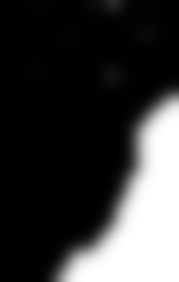

In [25]:
stain_mask

# Métodos de Difusão

In [26]:
from diffusers import StableDiffusionInpaintPipeline
from PIL import Image
import torch

pipe = StableDiffusionInpaintPipeline.from_pretrained(
    'runwayml/stable-diffusion-inpainting', torch_dtype=torch.float16
).to('cuda' if torch.cuda.is_available() else 'cpu')

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/748 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

safety_checker/pytorch_model.bin:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/552 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


In [27]:
def to_uint8(mask):
    # Se for PIL -> vira numpy
    if isinstance(mask, Image.Image):
        mask = np.array(mask)

    # Se for bool -> converte para 0–255
    if mask.dtype == bool:
        mask = mask.astype(np.uint8) * 255

    # Se for float -> normaliza 0–255
    if np.issubdtype(mask.dtype, np.floating):
        mask = (mask / mask.max() * 255).astype(np.uint8)

    # Se for 0–1 -> escala para 0–255
    if mask.max() <= 1:
        mask = (mask * 255).astype(np.uint8)

    return mask

def soften_mask(mask, blur=21):

    mask = to_uint8(mask)     # << ESSENCIAL

    # mask: numpy array 0-255
    soft = cv2.GaussianBlur(mask, (blur, blur), 0)
    soft = (soft / soft.max() * 255).astype(np.uint8)
    return soft

In [28]:
negative_prompt = (
    "distorted, warped, extra fingers, AI artifacts, blurry, low detail, "
    "fake texture, cartoon, digital effect, unsharp, do not invent new people or objects."
)

  0%|          | 0/30 [00:00<?, ?it/s]

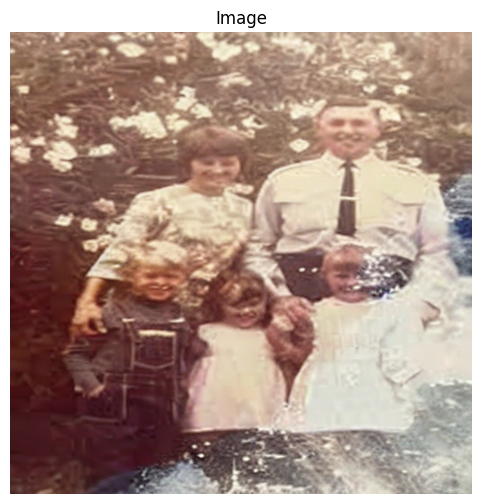

  0%|          | 0/42 [00:00<?, ?it/s]

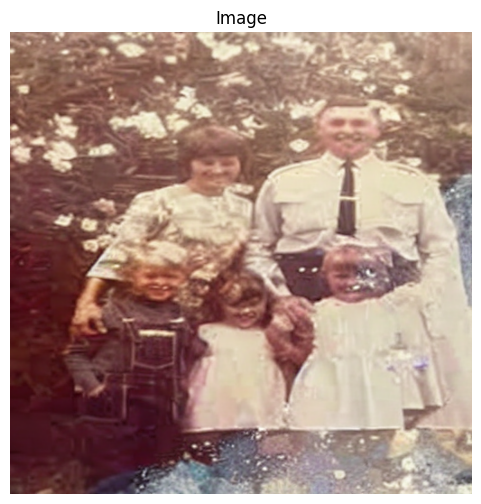

  0%|          | 0/54 [00:00<?, ?it/s]

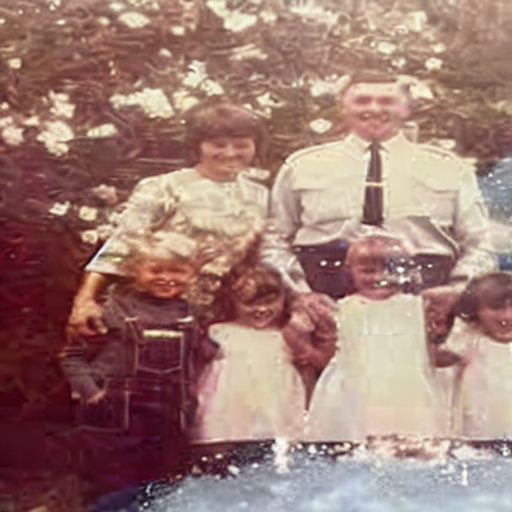

In [ ]:
# Load input image and mask
mask_soft = soften_mask(stain_mask, blur=21)
mask = Image.fromarray(mask_soft)
prompt = 'restore damaged photo, realistic skin texture, vintage style, photorealistic, make coerent colors'

r1 = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=image,
    mask_image=mask,
    guidance_scale=1.5,
    strength=0.5,
    num_inference_steps=60
).images[0]

show_image(r1)

r2 = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=r1,
    mask_image=mask,
    guidance_scale=1.5,
    strength=0.7,
    num_inference_steps=60
).images[0]

show_image(r2)

result = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=r2,
    mask_image=mask,
    guidance_scale=1.5,
    strength=0.9,
    num_inference_steps=60
).images[0]

result.save('reconstructed.png')
result

  0%|          | 0/30 [00:00<?, ?it/s]

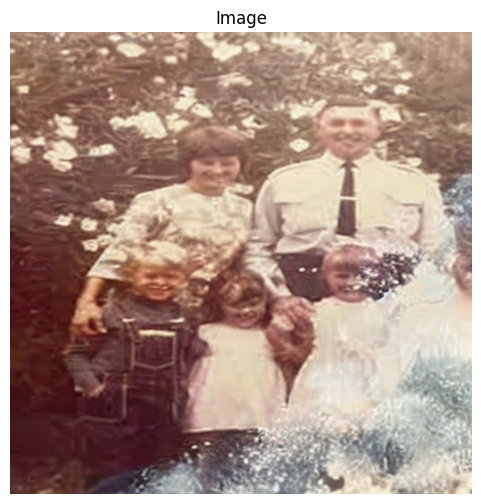

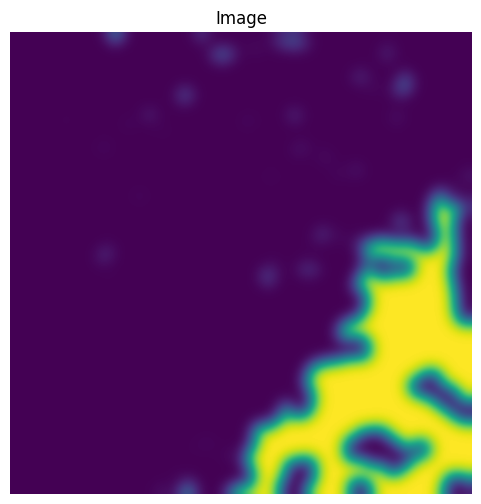

  0%|          | 0/42 [00:00<?, ?it/s]

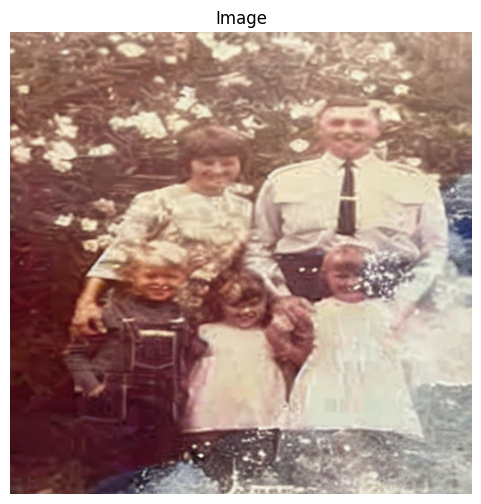

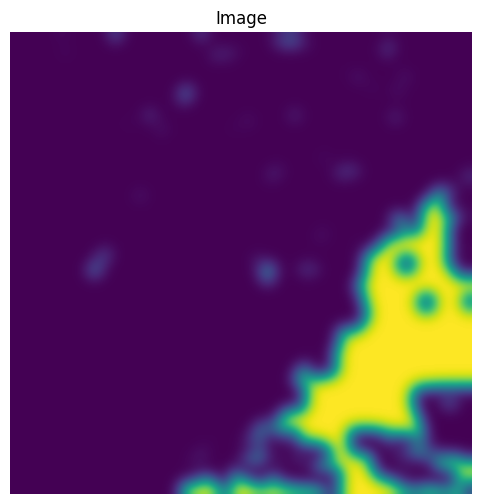

  0%|          | 0/54 [00:00<?, ?it/s]

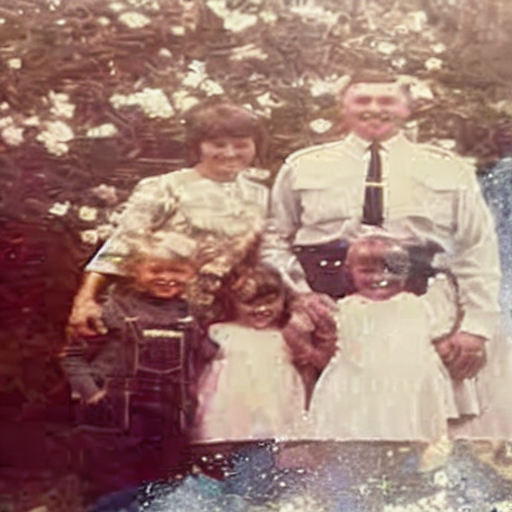

In [ ]:
# Load input image and mask
mask_soft = soften_mask(stain_mask, blur=21)
mask = Image.fromarray(mask_soft)
prompt = 'restore damaged photo, realistic skin texture, vintage style, photorealistic, make coerent colors'

r1_m = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=image,
    mask_image=mask,
    guidance_scale=1.5,
    strength=0.5,
    num_inference_steps=60
).images[0]

show_image(r1_m)

r1_m_np = np.array(r1_m)
stain_mask_1 = detect_big_stain(r1_m_np)

mask_soft = soften_mask(stain_mask_1, blur=21)
mask_1 = Image.fromarray(mask_soft)

show_image(mask_1)

r2_m = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=r1,
    mask_image=mask_1,
    guidance_scale=1.5,
    strength=0.7,
    num_inference_steps=60
).images[0]

show_image(r2_m)

r2_m_np = np.array(r2_m)
stain_mask_2 = detect_big_stain(r2_m_np)

mask_soft = soften_mask(stain_mask_2, blur=21)
mask_2 = Image.fromarray(mask_soft)

show_image(mask_2)

result_m = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=r2,
    mask_image=mask_2,
    guidance_scale=1.5,
    strength=0.9,
    num_inference_steps=60
).images[0]

result_m.save('reconstructed_m.png')
result_m

In [34]:
def dilate_mask(mask, kernel_size=35, iterations=1):
    """
    mask: array numpy binário (0 ou 255)
    kernel_size: tamanho da janela de dilatação
    iterations: quantas vezes dilatar
    """
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    dilated = cv2.dilate(mask, kernel, iterations=iterations)
    return dilated

  0%|          | 0/30 [00:00<?, ?it/s]

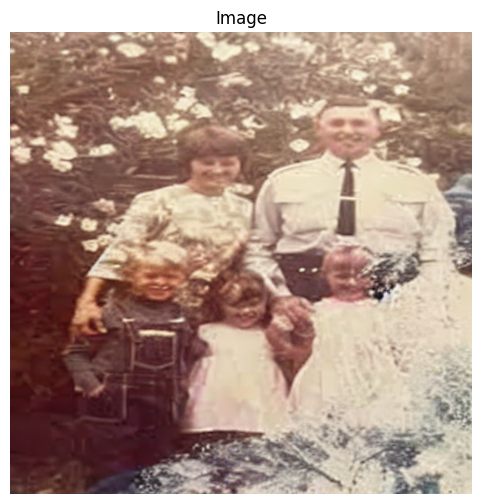

  0%|          | 0/42 [00:00<?, ?it/s]

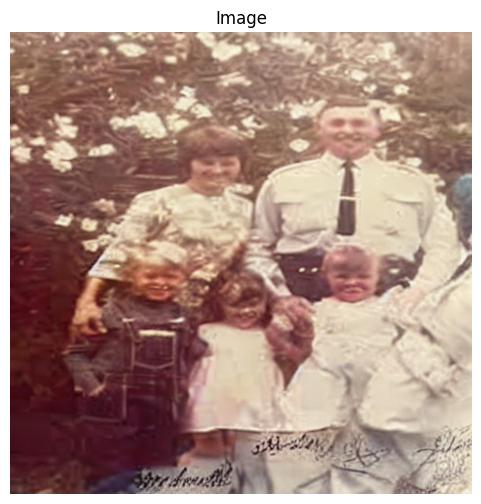

  0%|          | 0/54 [00:00<?, ?it/s]

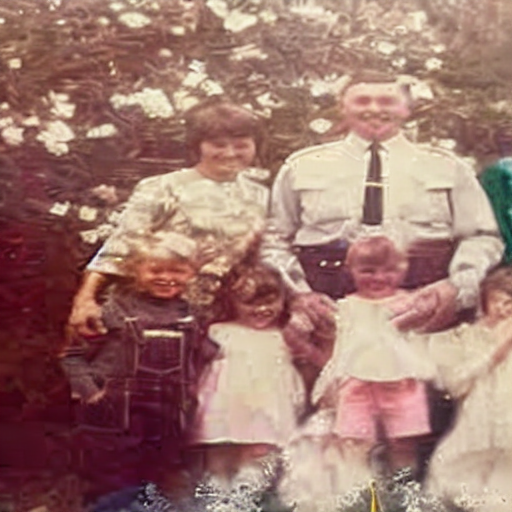

In [44]:
# --- Carregar máscara original (stain_mask deve ser array numpy) ---
mask_soft = soften_mask(stain_mask, blur=21)

# Aplicar dilatação
mask_dilated = dilate_mask(mask_soft, kernel_size=9, iterations=2)

# Converter para PIL
mask = Image.fromarray(mask_dilated)

# --- Parâmetros do prompt ---
prompt = (
    "restore damaged photo, realistic skin texture, vintage style, photorealistic, preserve original people, don't add anything to the scene"
)

r1_dilated = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=image,
    mask_image=mask,
    guidance_scale=1.5,
    strength=0.5,
    num_inference_steps=60
).images[0]

show_image(r1_dilated)

r2_dilated = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=r1_dilated,
    mask_image=mask,
    guidance_scale=1.5,
    strength=0.7,
    num_inference_steps=60
).images[0]

show_image(r2_dilated)

result_dilated = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=r2_dilated,
    mask_image=mask,
    guidance_scale=1.5,
    strength=0.9,
    num_inference_steps=60
).images[0]

result_dilated.save('reconstructed_photo.png')
result_dilated

In [57]:
def build_prompt(user_instruction: str):
    base_prompt = (
        "high-fidelity photo restoration, preserve original people and objects, "
        "keep original identity, maintain original scene, consistent colors, "
        "repair damaged areas, photorealistic, natural texture"
    )

    # A instrução do usuário só ajusta detalhes, não substitui o prompt principal
    if user_instruction:
        return f"{base_prompt}, {user_instruction}"
    else:
        return base_prompt

negative_prompt = (
    "new people, extra person, extra face, added objects, distorted face, wrong eyes, "
    "mutations, deformation, plastic skin, cartoon, artifacts, blurry, noise, "
    "duplicate heads, invented details"
)


# --- Função principal de restauração ---
def restore_image(pipe, image, stain_mask, user_instruction=""):
    # Criar máscara dilatada
    mask_soft = soften_mask(stain_mask, blur=21)
    mask_dilated = dilate_mask(mask_soft, kernel_size=10, iterations=1)
    mask = Image.fromarray(mask_dilated)

    # Construir prompt estável
    prompt = build_prompt(user_instruction)

    # --- Etapa 1 ---
    r1 = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=image,
        mask_image=mask,
        guidance_scale=0.9,     # baixo = menos dependência do prompt
        strength=0.5,
        num_inference_steps=60
    ).images[0]

    # --- Etapa 2 ---
    r2 = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=r1,
        mask_image=mask,
        guidance_scale=0.9,
        strength=0.7,
        num_inference_steps=60
    ).images[0]

    # --- Etapa 3 ---
    final = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=r2,
        mask_image=mask,
        guidance_scale=0.9,
        strength=0.9,
        num_inference_steps=60
    ).images[0]

    return final

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/42 [00:00<?, ?it/s]

  0%|          | 0/54 [00:00<?, ?it/s]

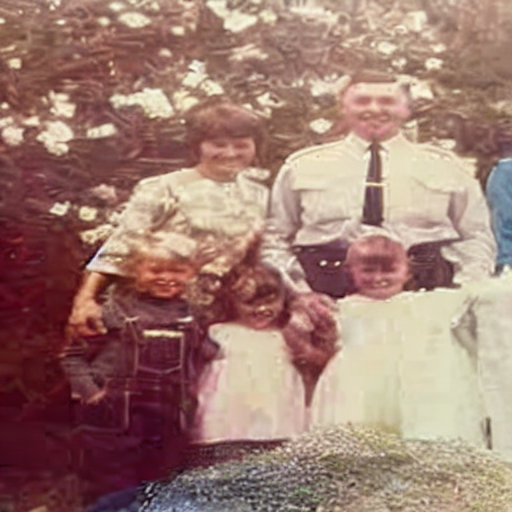

In [58]:
result_user = restore_image(
    pipe=pipe,
    image=image,
    stain_mask=stain_mask,
    user_instruction="keep the original faces, complete the scene coherently"
)

result_user.save("reconstructed_user.png")
result_user

# Super Resolution

In [29]:
import os
from PIL import Image
import torch
from diffusers import StableDiffusionUpscalePipeline
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity, peak_signal_noise_ratio

In [30]:
import torch, gc
gc.collect()
torch.cuda.empty_cache()
torch.cuda.ipc_collect()

In [31]:
device = "cuda" if torch.cuda.is_available() else "cpu"

pipe_superres = StableDiffusionUpscalePipeline.from_pretrained(
    "stabilityai/stable-diffusion-x4-upscaler",
    torch_dtype=torch.float16 if device=="cuda" else torch.float32,
)
pipe_superres = pipe_superres.to(device)

model_index.json:   0%|          | 0.00/485 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/300 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/825 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/634 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/348 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/982 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/587 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/221M [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.89G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [32]:
pipe_superres.enable_model_cpu_offload()
pipe_superres.enable_sequential_cpu_offload()

In [33]:
def resize_crop(img, target_size=(179, 282)):
    return img.resize(target_size, Image.LANCZOS)

In [63]:
def upscale_diffusion(
    img: Image.Image,
    prompt=(
        "ultra detailed, photorealistic enhancement, natural skin, "
        "accurate geometry, sharp textures, clean colors, restore fine detail"
    ),
    negative_prompt=(
        "blurry, distorted face, artifacts, plastic skin, noise, "
        "over-sharpened, texture repetition"
    ),
    steps=25,
    scale=5.0
):
    pipe_superres.enable_vae_tiling()
    pipe_superres.enable_attention_slicing()

    with torch.inference_mode():
        out = pipe_superres(
            prompt=prompt,
            negative_prompt=negative_prompt,
            image=img,
            num_inference_steps=steps,
            guidance_scale=scale
        )
    return out.images[0]

  0%|          | 0/5 [00:00<?, ?it/s]

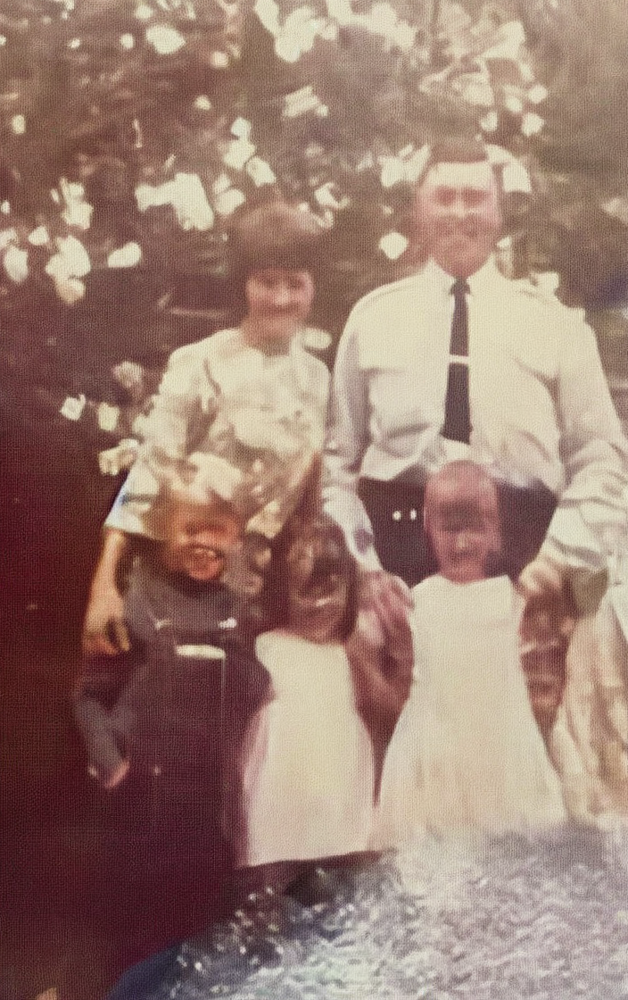

In [ ]:
entry = resize_crop(result)
hr = upscale_diffusion(entry)
hr

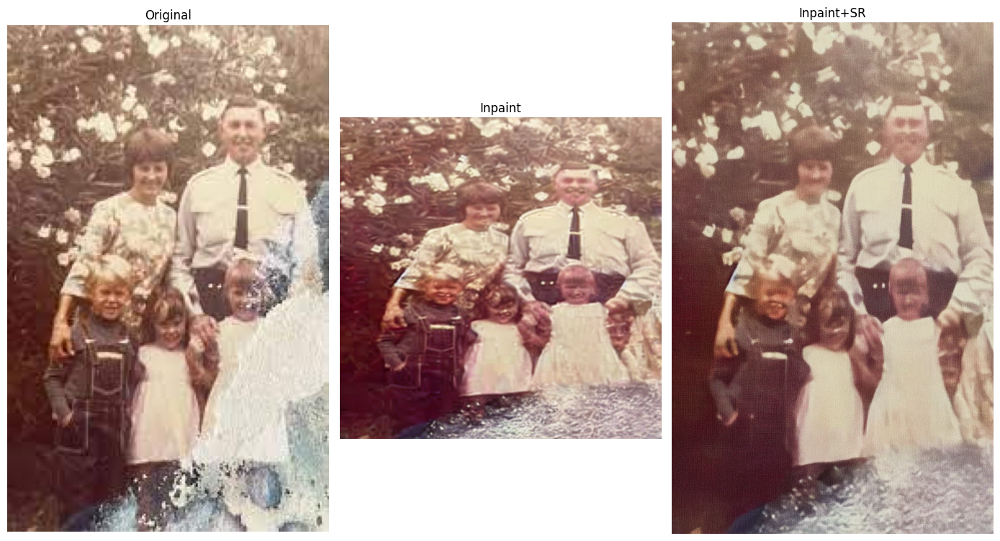

In [ ]:
# Mostrar resultados no notebook
fig, axs = plt.subplots(1,3, figsize=(14,8))
axs[0].imshow(image_np); axs[0].set_title('Original'); axs[0].axis('off')
axs[1].imshow(result); axs[1].set_title('Inpaint'); axs[1].axis('off')
axs[2].imshow(hr); axs[2].set_title('Inpaint+SR'); axs[2].axis('off')
plt.tight_layout()
plt.show()

  0%|          | 0/5 [00:00<?, ?it/s]

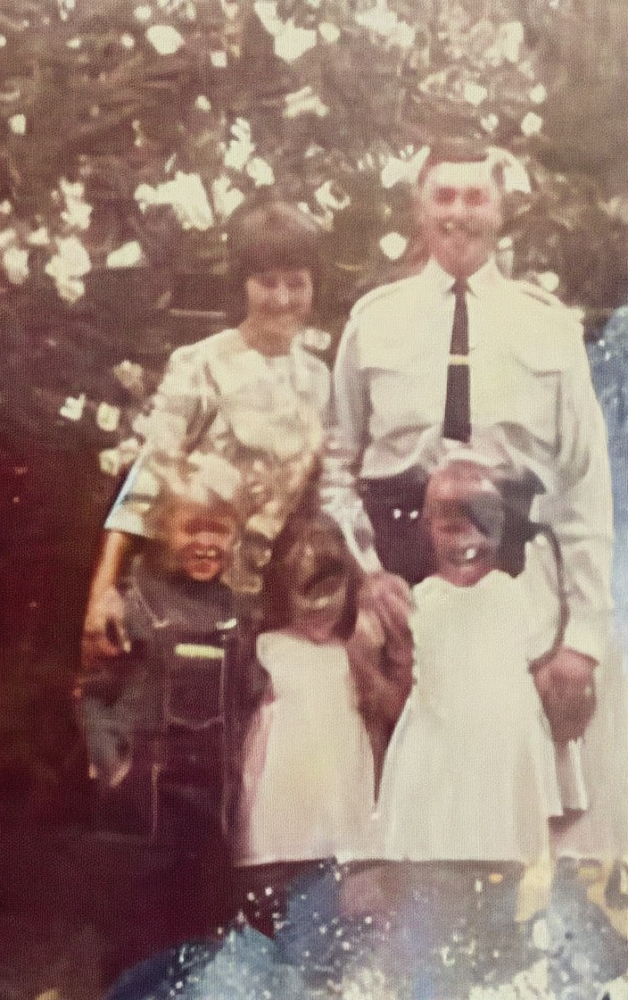

In [ ]:
entry_m = resize_crop(result_m)
hr_m = upscale_diffusion(entry_m, prompt="highly detailed, photorealistic, preserve faces, correct colors")
hr_m

  0%|          | 0/25 [00:00<?, ?it/s]

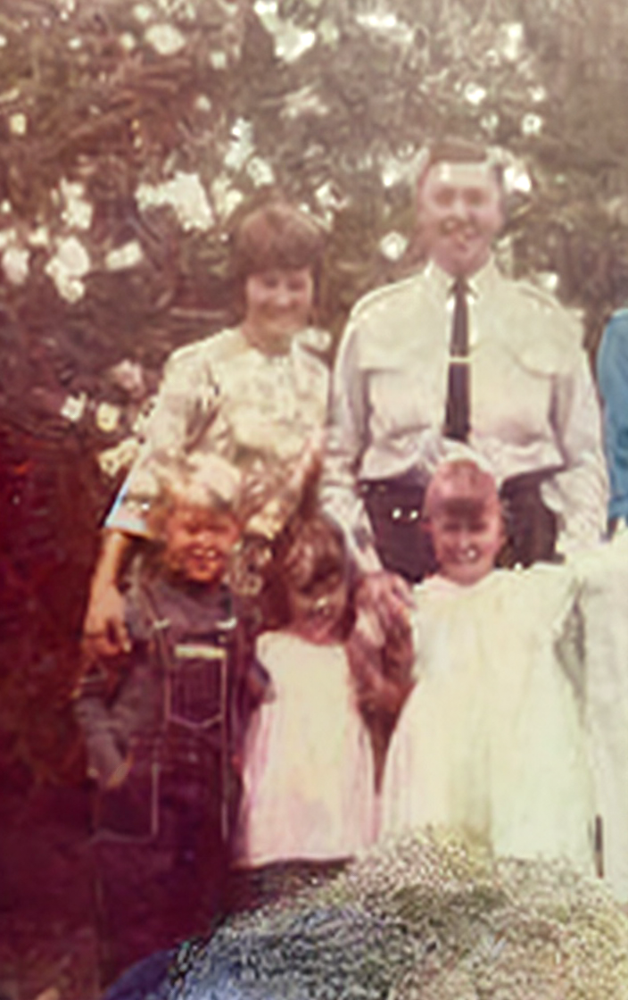

In [65]:
entry_user = resize_crop(result_user)
hr_user = upscale_diffusion(entry_user)
hr_user

In [66]:
hr_faces = upscale_diffusion(
    hr_user,
    prompt="face restoration, detailed eyes, natural skin texture, sharp portrait",
    negative_prompt="blurry, smudged, distorted facial features",
    steps=20,
    scale=5,
)

hr_faces

  0%|          | 0/20 [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 2.26 GiB. GPU 0 has a total capacity of 14.74 GiB of which 2.14 GiB is free. Process 4035 has 12.60 GiB memory in use. Of the allocated memory 10.90 GiB is allocated by PyTorch, and 1.57 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)